<a href="https://colab.research.google.com/github/tumble-weed/GANs/blob/master/dcgan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
'''Uncomment for Colab'''
# !pip install -I --no-cache-dir pillow

    100% |████████████████████████████████| 2.0MB 36.3MB/s 
imgaug 0.2.8 has requirement numpy>=1.15.0, but you'll have numpy 1.14.6 which is incompatible.
fastai 1.0.46 has requirement numpy>=1.15, but you'll have numpy 1.14.6 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


In [0]:
import torch,torchvision
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
from tqdm import tqdm_notebook

tensor_to_numpy = lambda t:t.detach().cpu().numpy()
matplotlib.rcParams['axes.grid'] = False
is_cuda = torch.cuda.is_available()


In [0]:
# read in data, make transforms, make data loader
# define models for G and D
# define optimizer
# define loss for each
# train in loop

In [0]:
''' SVHN data '''
mu = (0.5,0.5,0.5)
std = (0.5,0.5,0.5)

torch_mu  = torch.tensor(mu).float().view(1,3,1,1)
torch_std  = torch.tensor(std).float().view(1,3,1,1)


preprocess = torchvision.transforms.Compose([torchvision.transforms.ToTensor(),
                                             torchvision.transforms.Normalize(mean =mu,
                                                                             std=std)
                                            ])
svhn_train = torchvision.datasets.SVHN(root='.',
                                       download=True,
                                       split = 'train',
                                      transform = preprocess)
batch_size = 32
train_loader = torch.utils.data.DataLoader(svhn_train,
                                           batch_size = batch_size,
                                           shuffle=True,
                                           num_workers = 4
                                          ) # data loader is the one that actually applies the transform
svhn_val = torchvision.datasets.SVHN(root='.',
                                       download=True,
                                       split = 'test',
                                      transform = preprocess)

train_loader = torch.utils.data.DataLoader(svhn_train,
                                           batch_size = batch_size,
                                           shuffle=False,
                                           num_workers = 4
                                          ) # data loader is the one that actually applies the transform
denormalize = lambda t:t*torch_std.to(t.device) + torch_mu.to(t.device)

Using downloaded and verified file: ./train_32x32.mat
Using downloaded and verified file: ./test_32x32.mat


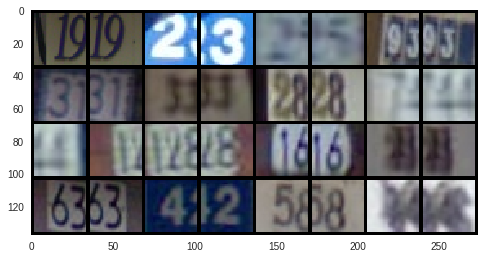

In [0]:
'''Visualize the data'''
trainiter = iter(train_loader)
bx,by =trainiter.next()
bx = denormalize(bx)
bx_ = torchvision.utils.make_grid(bx.detach())
im_bx_ = np.transpose(bx_,(1,2,0))
plt.figure()
plt.imshow(im_bx_)
# bx_ = tensor_to_numpy(bx)
# im_bx_ = np.transposebx_


In [0]:
class Generator(torch.nn.Module):
    def __init__(self,
                 zsize,
                 spatial_size,
                 deconv_info,
                ):
        super(Generator,self).__init__()
        self.zsize = zsize
        self.spatial_size = spatial_size
        self.deconv_info = deconv_info
        
        layers = []
        outchan = np.prod(spatial_size)
        layers.append(torch.nn.Linear(zsize,
                                      outchan))
        inchan = spatial_size[0]
        for li,(outchan,k) in enumerate(deconv_info):
            layers.append(torch.nn.ConvTranspose2d(inchan,
                                                  outchan,
                                                  k,
                                                   stride = 2,
                                                  padding= 1,
                                                  bias = True,))
            if li < len(deconv_info):
                layers.append(torch.nn.BatchNorm2d(outchan))
            inchan = outchan
        self.layers = torch.nn.ModuleList(layers)
                
      
        
        pass
    def forward(self,x):
        x = self.layers[0](x)
        x = x.view((-1,)+self.spatial_size)
        for l in self.layers[1:-1]:
            x = l(x)
            x = torch.nn.functional.relu(x)
        x = self.layers[-1](x)
        x = torch.nn.functional.tanh(x)
        return x
z_size = 100
G = Generator(z_size,(128,4,4),[(64,4),(32,4),(3,4)]
             )
v = torch.ones(2,100)
if is_cuda:
    G.cuda()
    print(G(v.cuda()).shape)
else:
    print(G(v).shape)

torch.Size([2, 3, 32, 32])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


In [0]:
class Discriminator(torch.nn.Module):
    def __init__(self,
                 inchan,
                 layer_info,
                 ):
        super(Discriminator,
             self).__init__()
        
        self.layer_info = layer_info
        layers = []
        for i,(outchan,k) in enumerate(layer_info):
            layers.append(torch.nn.Conv2d(inchan,
                                          outchan,
                                          k,
                                          stride=2,
                                         padding=1))
            if i > 0:
                layers.append(torch.nn.BatchNorm2d(outchan))
            inchan = outchan
        
        layers.append(torch.nn.Linear(layer_info[-1][0]*4*4,1))
        self.layers = torch.nn.ModuleList(layers)
        pass
    def forward(self,x):
        for l in self.layers[:-1]:
            x = l(x)
            x = torch.nn.functional.leaky_relu(x,0.2)
        x = x.view(-1,self.layer_info[-1][0]*4*4)
        x = self.layers[-1](x)
        return(x)
D = Discriminator(3,[(32,4),
                   (64,4),
                  (128,4),])

v = torch.ones(10,3,32,32).float()
print(D)
if is_cuda:
    D.cuda()
    print(D(v.cuda()).shape)
else:
    print(D(v).shape)

Discriminator(
  (layers): ModuleList(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Linear(in_features=2048, out_features=1, bias=True)
  )
)
torch.Size([10, 1])


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


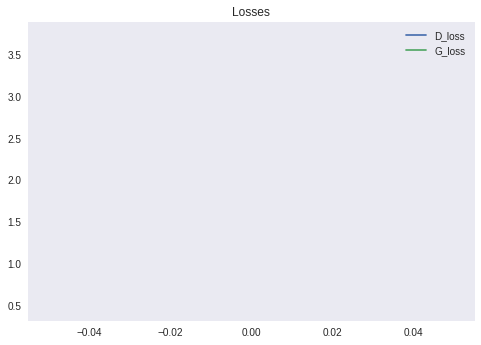

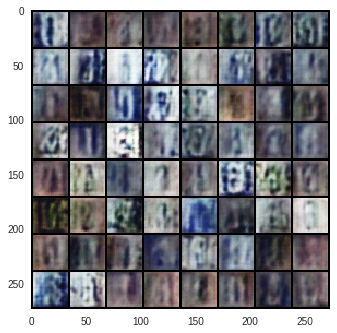

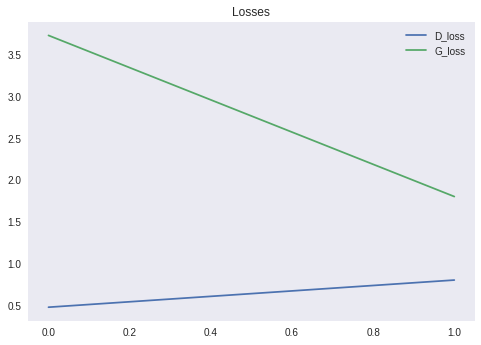

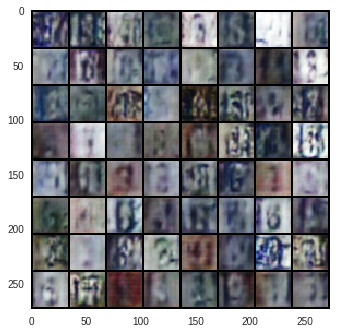

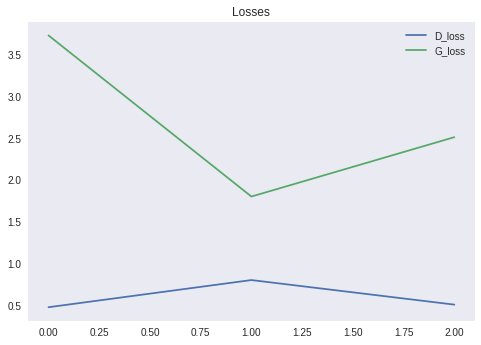

...

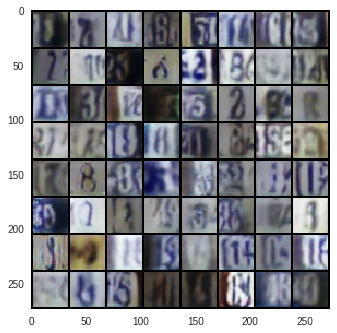

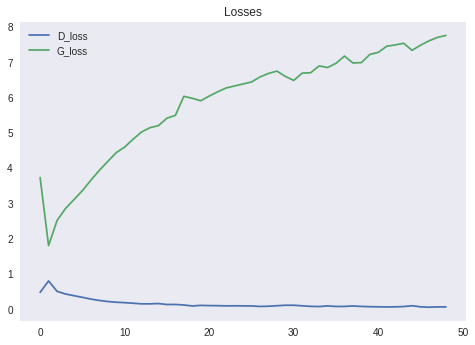

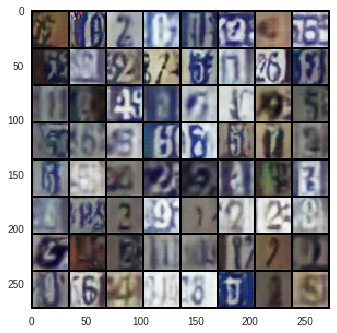

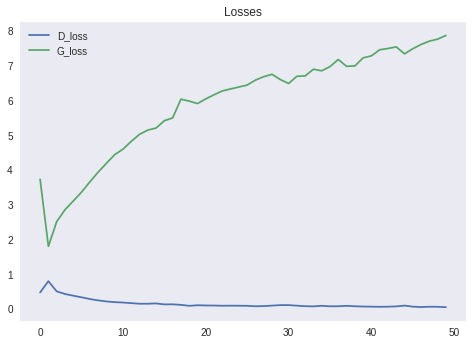

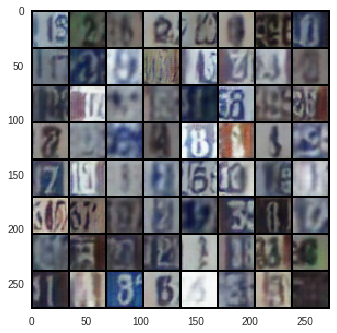

In [0]:
lr = 2e-4
beta1 = 0.5
beta2 = 0.99
opt_D = torch.optim.Adam(D.parameters(),lr=lr,betas = (beta1,beta2))
opt_G = torch.optim.Adam(G.parameters(),lr=lr,betas = (beta1,beta2))

nepochs = 50
viz_freq = 1
trends  = {'D_loss':[],
          'G_loss' : []}
update_avg = lambda avg,n,val:(avg*n + val)/(n+1.)

for e in tqdm_notebook(range(nepochs)):
    ''' Discriminator Loss '''
    running_metric = {'D_loss' : 0.,
                   'G_loss' : 0,} 
    for bix,(bx,by) in enumerate(train_loader):
        ''' D(Real) '''
        bsize = bx.shape[0]
        if is_cuda:
            bx = bx.cuda()
            by = by.cuda()
        D_bx = D(bx)
        
        y_real = torch.ones(bsize,1)
        if is_cuda:
            y_real = y_real.cuda()
        D_loss_real = torch.nn.functional.binary_cross_entropy_with_logits(D_bx,y_real)
        
        ''' D(Fake) '''
        b_noise = 2*torch.rand(bsize,z_size).float() -1 
        if is_cuda:
            b_noise = b_noise.cuda()
        G_noise = G(b_noise)
        D_fake = D(G_noise)
        
        y_fake = torch.zeros(bsize,1)
        if is_cuda:
            y_fake = y_fake.cuda()
        D_loss_fake = torch.nn.functional.binary_cross_entropy_with_logits(D_fake,y_fake)
        
        ''' Update D'''
        D_loss = D_loss_real + D_loss_fake
        opt_D.zero_grad()
        D_loss.backward()
        opt_D.step()
        
        '''G(noise)'''
        G_noise = G(b_noise)
        D_fake = D(G_noise)
        G_loss = torch.nn.functional.binary_cross_entropy_with_logits(D_fake,y_real)
        
        opt_G.zero_grad()
        G_loss.backward()
        opt_G.step()
        
        running_metric['D_loss'] = update_avg(running_metric['D_loss'],
                                             bix,
                                             tensor_to_numpy(D_loss))
        running_metric['G_loss'] = update_avg(running_metric['G_loss'],
                                             bix,
                                             tensor_to_numpy(G_loss))
#         break
    trends['D_loss'].append(running_metric['D_loss'])
    trends['G_loss'].append(running_metric['G_loss'])

    if e%viz_freq == 0:
        ''' visualize losses '''
        plt.figure()
        plt.plot(trends['D_loss'],label='D_loss')
        plt.plot(trends['G_loss'],label='G_loss')
        plt.legend()
        plt.title('Losses')
        plt.show()
        ''' visualize samples '''
        b_noise = 2*torch.rand(2*batch_size,z_size).float() -1 
        if is_cuda:
            b_noise = b_noise.cuda()
        G_noise = G(b_noise)
        fake = denormalize(G_noise)
        grid_fake = torchvision.utils.make_grid(fake)
        fake_ = tensor_to_numpy(grid_fake)
        
        im_fake_ = np.transpose(fake_,[1,2,0])
        plt.figure()
        plt.imshow(im_fake_)
        plt.show()
        pass
    pass